<a href="https://colab.research.google.com/github/prashant090683/MiniProject_EmployeeAttritionPrediction/blob/main/M1_NB_MiniProject_1_Employee_Attrition_Prediction_Iteration2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Advanced Certification Programme in AI and MLOps
## A programme by IISc and TalentSprint
### Mini Project Notebook: Employee Attrition Prediction

## Problem Statement

To predict employee attrition using CatBoost and XgBoost

## Learning Objectives

At the end of the experiment, you will be able to

* explore the employee attrition dataset
* apply CatBoost and XgBoost on the dataset
* tune the model hyperparameters to improve accuracy
* evaluate the model using suitable metrics


## Introduction

Employee attrition is the gradual reduction in employee numbers. Employee attrition happens when the size of your workforce diminishes over time. This means that employees are leaving faster than they are hired. Employee attrition happens when employees retire, resign, or simply aren't replaced.
Although employee attrition can be company-wide, it may also be confined to specific parts of a business.

Employee attrition can happen for several reasons. These include unhappiness about employee benefits or the pay structure, a lack of employee development opportunities, and even poor conditions in the workplace.

To know more about the factors that lead to employee attrition, refer [here](https://www.betterup.com/blog/employee-attrition#:~:text=Employee%20attrition%20is%20the%20gradual,or%20simply%20aren't%20replaced).


**Gradient Boosted Decision Trees**

* Gradient boosted decision trees (GBDTs) are one of the most important machine learning models.

* GBDTs originate from AdaBoost, an algorithm that ensembles weak learners and uses the majority vote, weighted by their individual accuracy, to solve binary classification problems. The weak learners in this case are decision trees with a single split, called decision stumps.

* Some of the widely used gradient boosted decision trees are XgBoost, CatBoost and LightGBM.

## Dataset

The dataset used for this mini-project is [HR Employee Attrition dataset](https://data.world/aaizemberg/hr-employee-attrition). This dataset is synthetically created by IBM data scientists. There are 35 features and 1470 records.

There are numerical features such as:

* Age
* DistanceFromHome
* EmployeeNumber
* PerformanceRating

There are several categorical features such as:
* JobRole
* EducationField
* Department
* BusinessTravel

Dependent or target feature is 'attrition' which has values as Yes/No.

In [ ]:
#@title Download the data
!wget -qq https://cdn.iisc.talentsprint.com/CDS/Datasets/wa_fn_usec_hr_employee_attrition_tsv.csv
print("Data Downloaded Successfuly!!")

Data Downloaded Successfuly!!


## Grading = 10 Points

### Install Required Dependencies

In [ ]:
# Install CatBoost
!pip -qq install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 4.9 MB/s eta 0:00:00


### Import Required Packages

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier, metrics
import warnings
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
pd.set_option('display.max_columns', 100)
%matplotlib inline

Please refer to the [ReadMe](https://drive.google.com/file/d/1V5CAUlRwLNcQcIWfgCJhukYvRESi2cC2/view?usp=sharing) before proceeding further.

# Part-A

## Load the Dataset

**Exercise 1: Read the dataset [0.5 Mark]**

**Hint:** pd.read_csv()

In [ ]:
# read the dataset
df = pd.read_csv('/content/wa_fn_usec_hr_employee_attrition_tsv.csv')


In [ ]:
# Check the shape of dataframe.
df.shape

(1470, 35)

In [ ]:
df.head()

,age,attrition,businesstravel,dailyrate,department,distancefromhome,education,educationfield,employeecount,employeenumber,environmentsatisfaction,gender,hourlyrate,jobinvolvement,joblevel,jobrole,jobsatisfaction,maritalstatus,monthlyincome,monthlyrate,numcompaniesworked,over18,overtime,percentsalaryhike,performancerating,relationshipsatisfaction,standardhours,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


The dataset has 1470 rows with 35 columns

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   age                       1470 non-null   int64 
 1   attrition                 1470 non-null   object
 2   businesstravel            1470 non-null   object
 3   dailyrate                 1470 non-null   int64 
 4   department                1470 non-null   object
 5   distancefromhome          1470 non-null   int64 
 6   education                 1470 non-null   int64 
 7   educationfield            1470 non-null   object
 8   employeecount             1470 non-null   int64 
 9   employeenumber            1470 non-null   int64 
 10  environmentsatisfaction   1470 non-null   int64 
 11  gender                    1470 non-null   object
 12  hourlyrate                1470 non-null   int64 
 13  jobinvolvement            1470 non-null   int64 
 14  joblevel                

In [ ]:
# Data Summary
print("Descriptive statistics:")
print(df.describe())

Descriptive statistics:
               age    dailyrate  distancefromhome    education  employeecount  \
count  1470.000000  1470.000000       1470.000000  1470.000000         1470.0   
mean     36.923810   802.485714          9.192517     2.912925            1.0   
std       9.135373   403.509100          8.106864     1.024165            0.0   
min      18.000000   102.000000          1.000000     1.000000            1.0   
25%      30.000000   465.000000          2.000000     2.000000            1.0   
50%      36.000000   802.000000          7.000000     3.000000            1.0   
75%      43.000000  1157.000000         14.000000     4.000000            1.0   
max      60.000000  1499.000000         29.000000     5.000000            1.0   

       employeenumber  environmentsatisfaction   hourlyrate  jobinvolvement  \
count     1470.000000              1470.000000  1470.000000     1470.000000   
mean      1024.865306                 2.721769    65.891156        2.729932   
std      

In [ ]:
# Separate numerical and categorical feature names
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = df.select_dtypes(include=['object']).columns.tolist()

print("Numerical Features:", numerical_features)
print("Categorical Features:", categorical_features)

Numerical Features: ['age', 'dailyrate', 'distancefromhome', 'education', 'employeecount', 'employeenumber', 'environmentsatisfaction', 'hourlyrate', 'jobinvolvement', 'joblevel', 'jobsatisfaction', 'monthlyincome', 'monthlyrate', 'numcompaniesworked', 'percentsalaryhike', 'performancerating', 'relationshipsatisfaction', 'standardhours', 'stockoptionlevel', 'totalworkingyears', 'trainingtimeslastyear', 'worklifebalance', 'yearsatcompany', 'yearsincurrentrole', 'yearssincelastpromotion', 'yearswithcurrmanager']
Categorical Features: ['attrition', 'businesstravel', 'department', 'educationfield', 'gender', 'jobrole', 'maritalstatus', 'over18', 'overtime']


## Data Exploration

- Check for missing values
- Check for features having consistent data across samples
- Check for outliers or inconsistencies in data columns
- Check for correlated features
- Do we have a target label imbalance
- How our independent variables are distributed relative to our target label
- Are there features that have strong linear or monotonic relationships? Making correlation heatmaps makes it easy to identify possible collinearity

**Exercise 2: Create a `List` of numerical and categorical columns. Display a statistical description of the dataset. Remove missing values (if any) [0.5 Mark]**

**Hint:**
>Use `for` to iterate through each column.

>For statistical description display - samples count, missing values count, range, and data type of each feature.

In [ ]:
# Separate numerical and categorical feature names
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = df.select_dtypes(include=['object']).columns.tolist()

print("Numerical Features:", numerical_features)
print("Categorical Features:", categorical_features)

Numerical Features: ['age', 'dailyrate', 'distancefromhome', 'education', 'employeecount', 'employeenumber', 'environmentsatisfaction', 'hourlyrate', 'jobinvolvement', 'joblevel', 'jobsatisfaction', 'monthlyincome', 'monthlyrate', 'numcompaniesworked', 'percentsalaryhike', 'performancerating', 'relationshipsatisfaction', 'standardhours', 'stockoptionlevel', 'totalworkingyears', 'trainingtimeslastyear', 'worklifebalance', 'yearsatcompany', 'yearsincurrentrole', 'yearssincelastpromotion', 'yearswithcurrmanager']
Categorical Features: ['attrition', 'businesstravel', 'department', 'educationfield', 'gender', 'jobrole', 'maritalstatus', 'over18', 'overtime']


In [ ]:
print(type(numerical_features))

<class 'list'>


In [ ]:
print(df.isnull().sum())

age                         0
attrition                   0
businesstravel              0
dailyrate                   0
department                  0
distancefromhome            0
education                   0
educationfield              0
employeecount               0
employeenumber              0
environmentsatisfaction     0
gender                      0
hourlyrate                  0
jobinvolvement              0
joblevel                    0
jobrole                     0
jobsatisfaction             0
maritalstatus               0
monthlyincome               0
monthlyrate                 0
numcompaniesworked          0
over18                      0
overtime                    0
percentsalaryhike           0
performancerating           0
relationshipsatisfaction    0
standardhours               0
stockoptionlevel            0
totalworkingyears           0
trainingtimeslastyear       0
worklifebalance             0
yearsatcompany              0
yearsincurrentrole          0
yearssince

In [ ]:
# Remove missing values
df.dropna(inplace=True)

# Confirm removal of missing values
print("Missing values after removal:")
print(df.isnull().sum())

Missing values after removal:
age                         0
attrition                   0
businesstravel              0
dailyrate                   0
department                  0
distancefromhome            0
education                   0
educationfield              0
employeecount               0
employeenumber              0
environmentsatisfaction     0
gender                      0
hourlyrate                  0
jobinvolvement              0
joblevel                    0
jobrole                     0
jobsatisfaction             0
maritalstatus               0
monthlyincome               0
monthlyrate                 0
numcompaniesworked          0
over18                      0
overtime                    0
percentsalaryhike           0
performancerating           0
relationshipsatisfaction    0
standardhours               0
stockoptionlevel            0
totalworkingyears           0
trainingtimeslastyear       0
worklifebalance             0
yearsatcompany              0
yearsincur

NO nulls were present


In [ ]:
# Display statistical description
print(df.describe())

               age    dailyrate  distancefromhome    education  employeecount  \
count  1470.000000  1470.000000       1470.000000  1470.000000         1470.0   
mean     36.923810   802.485714          9.192517     2.912925            1.0   
std       9.135373   403.509100          8.106864     1.024165            0.0   
min      18.000000   102.000000          1.000000     1.000000            1.0   
25%      30.000000   465.000000          2.000000     2.000000            1.0   
50%      36.000000   802.000000          7.000000     3.000000            1.0   
75%      43.000000  1157.000000         14.000000     4.000000            1.0   
max      60.000000  1499.000000         29.000000     5.000000            1.0   

       employeenumber  environmentsatisfaction   hourlyrate  jobinvolvement  \
count     1470.000000              1470.000000  1470.000000     1470.000000   
mean      1024.865306                 2.721769    65.891156        2.729932   
std        602.024335            

In [ ]:
# Display statistical description for numerical columns
print("Statistical Description for Numerical Columns:")
print(df.describe())

# Display statistical description for categorical columns
print("\nStatistical Description for Categorical Columns:")
print(df.describe(include=['object']))

Statistical Description for Numerical Columns:
               age    dailyrate  distancefromhome    education  employeecount  \
count  1470.000000  1470.000000       1470.000000  1470.000000         1470.0   
mean     36.923810   802.485714          9.192517     2.912925            1.0   
std       9.135373   403.509100          8.106864     1.024165            0.0   
min      18.000000   102.000000          1.000000     1.000000            1.0   
25%      30.000000   465.000000          2.000000     2.000000            1.0   
50%      36.000000   802.000000          7.000000     3.000000            1.0   
75%      43.000000  1157.000000         14.000000     4.000000            1.0   
max      60.000000  1499.000000         29.000000     5.000000            1.0   

       employeenumber  environmentsatisfaction   hourlyrate  jobinvolvement  \
count     1470.000000              1470.000000  1470.000000     1470.000000   
mean      1024.865306                 2.721769    65.891156      

First, we want to get a sense of our data:
- What features have the most divergent distributions based on target class
- Do we have a target label imbalance
- How our independent variables are distributed relative to our target label
- Are there features that have strong linear or monotonic relationships, making correlation heatmaps makes it easy to identify possible colinearity

### Check for outliers

**Exercise 3: Create a box plot to check for outliers [0.5 Mark]**

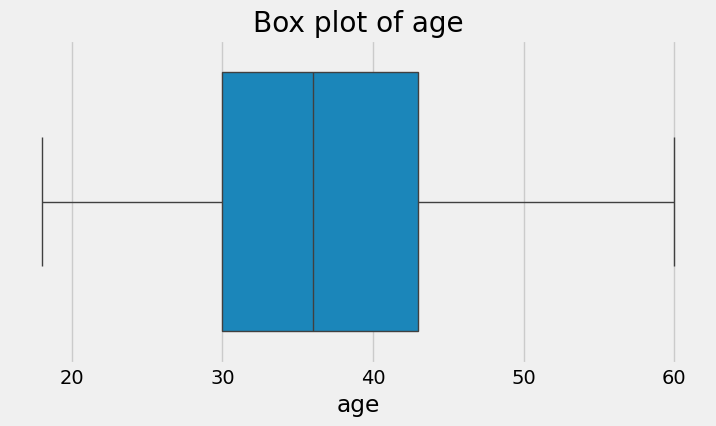

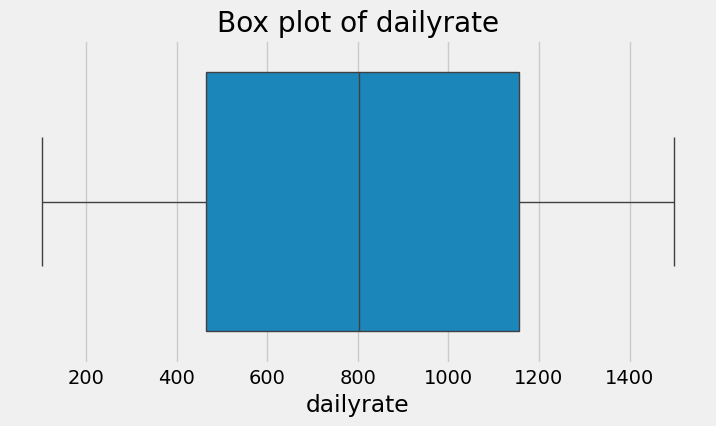

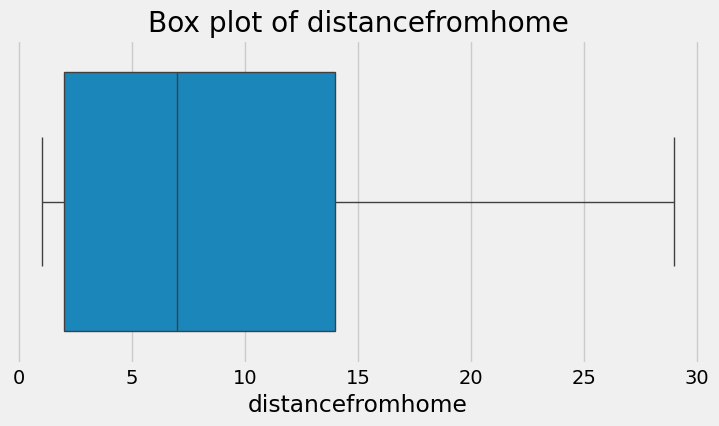

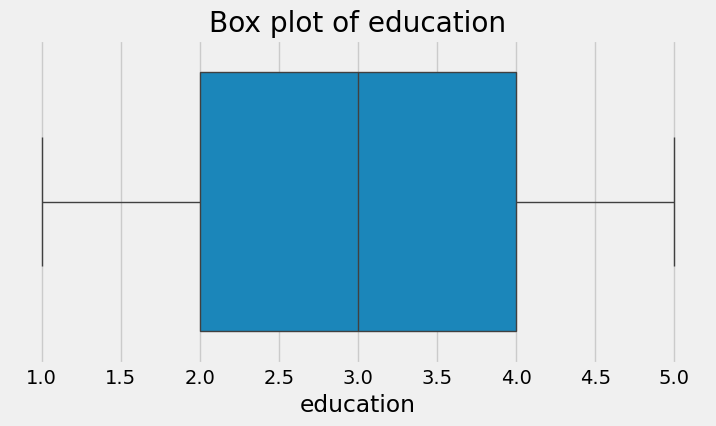

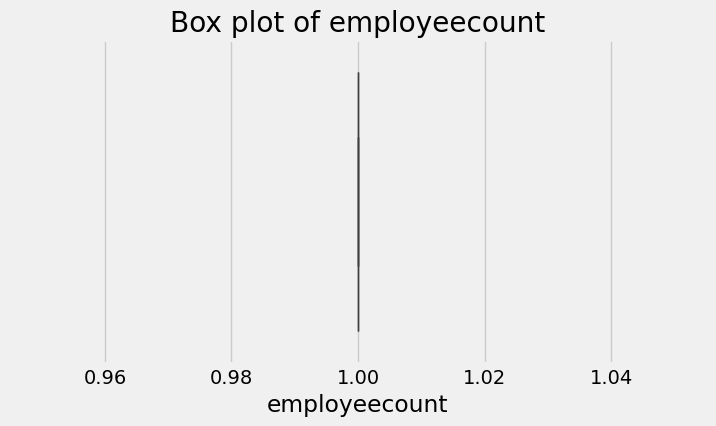

...

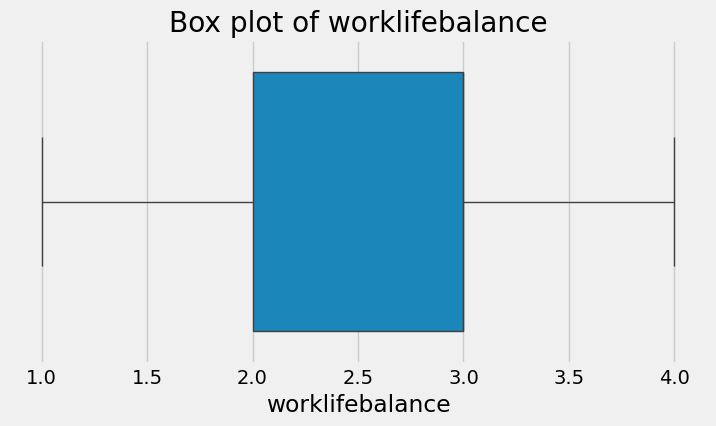

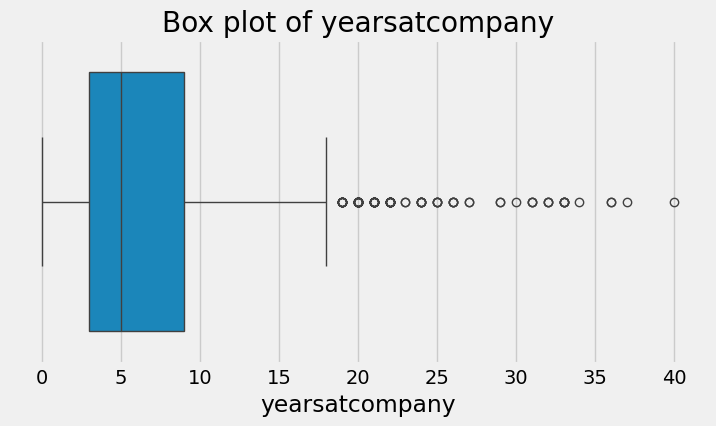

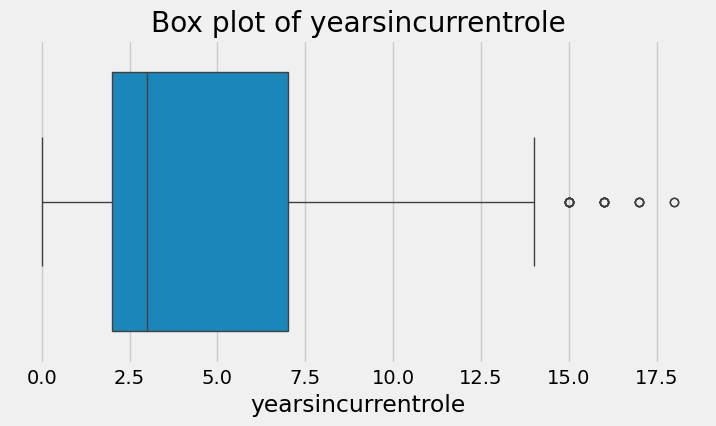

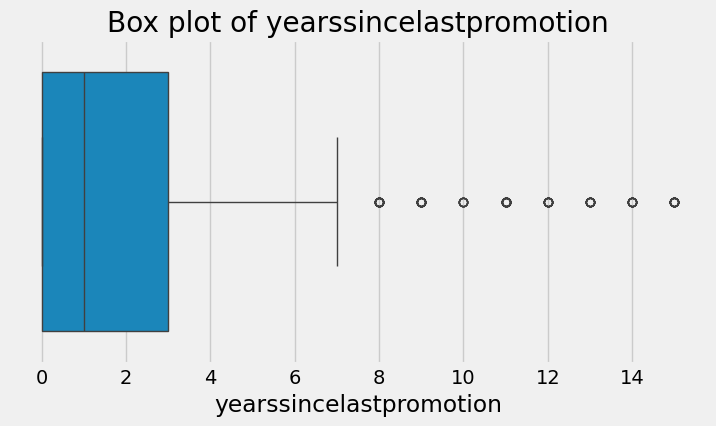

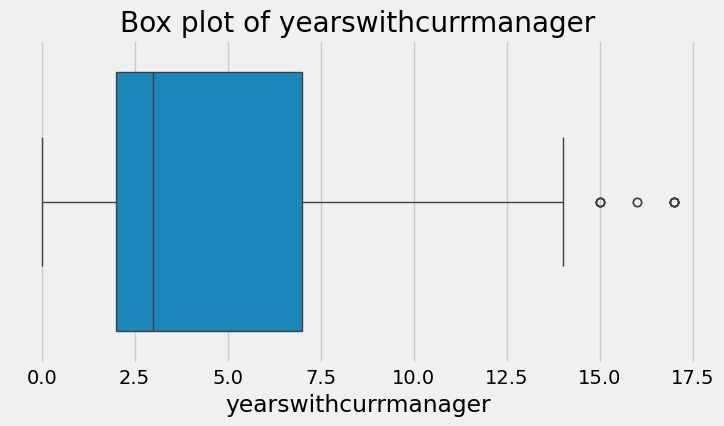

In [ ]:
# Select numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Create box plots for each numerical column
for column in numerical_columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[column])
    plt.title(f"Box plot of {column}")
    plt.show()

### Handling outliers

**Exercise 4: Use lower bound as 25% and upper bound as 75% to handle the outliers [0.5 Mark]**

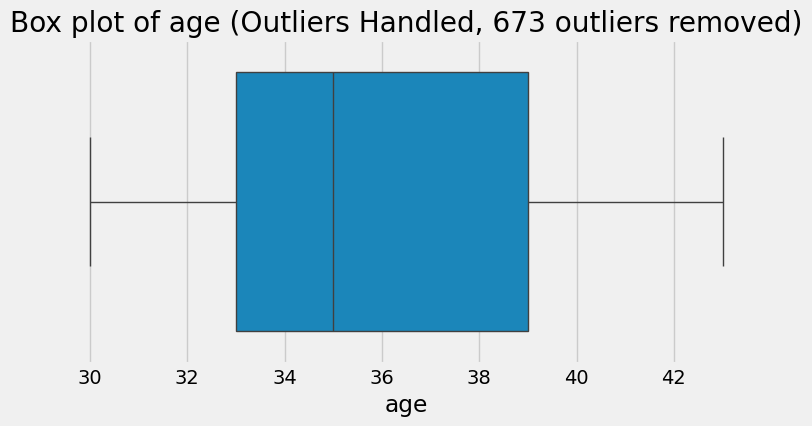

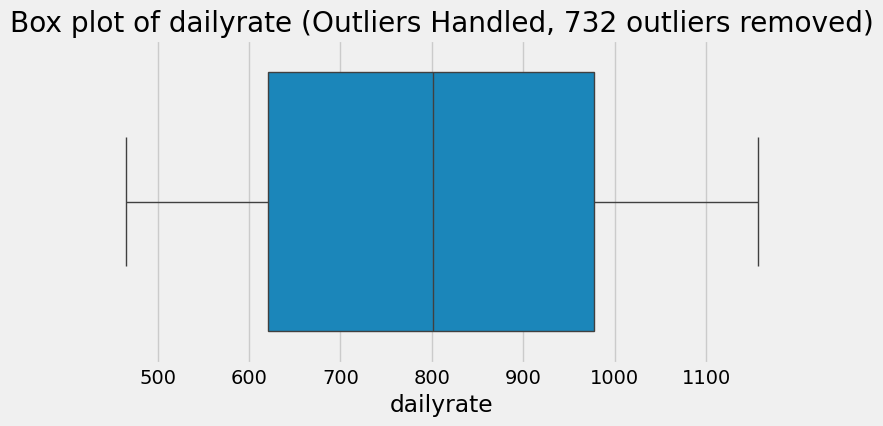

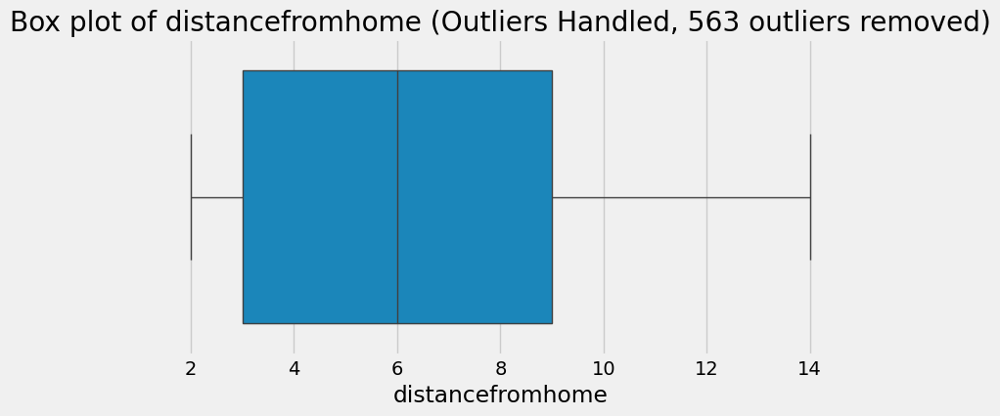

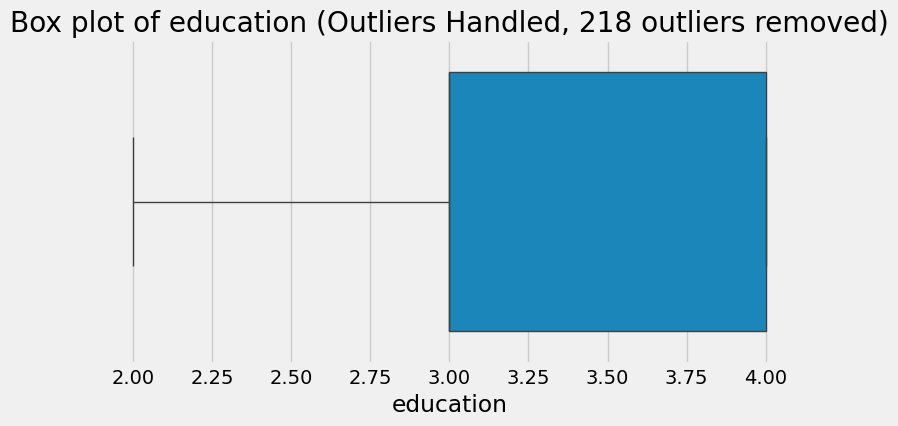

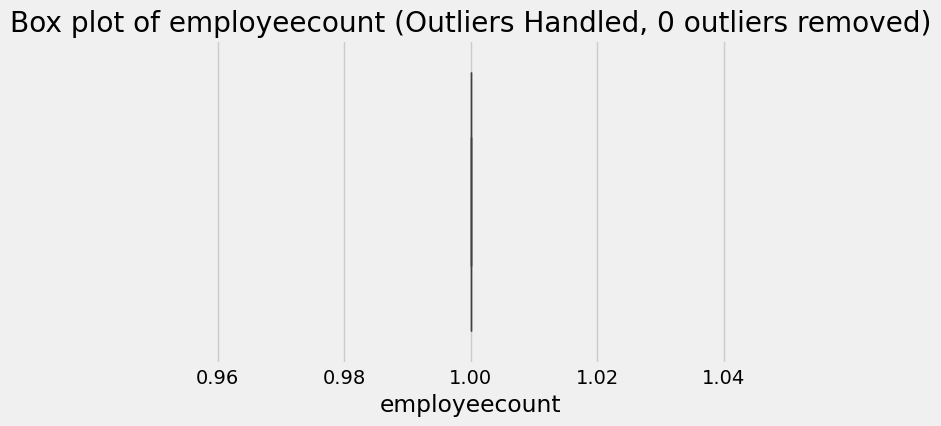

...

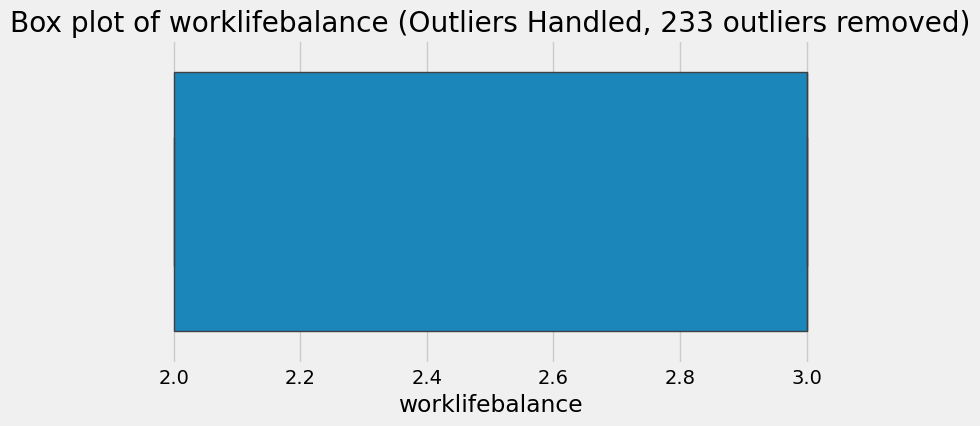

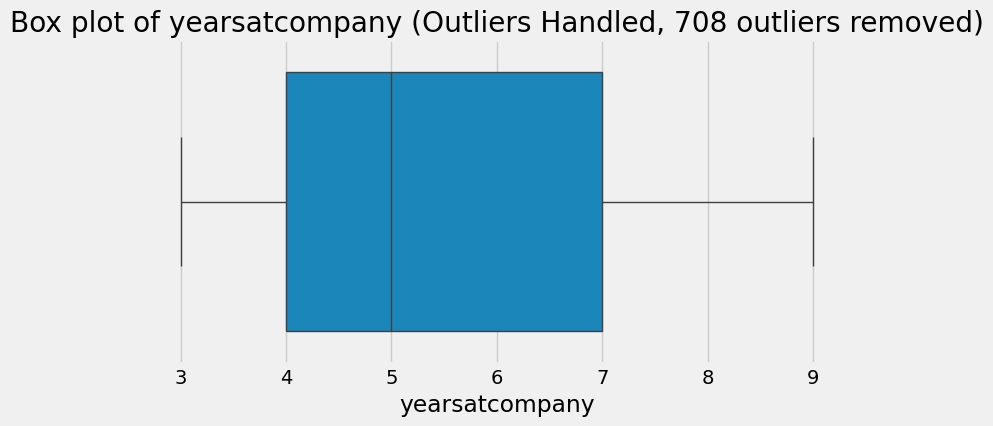

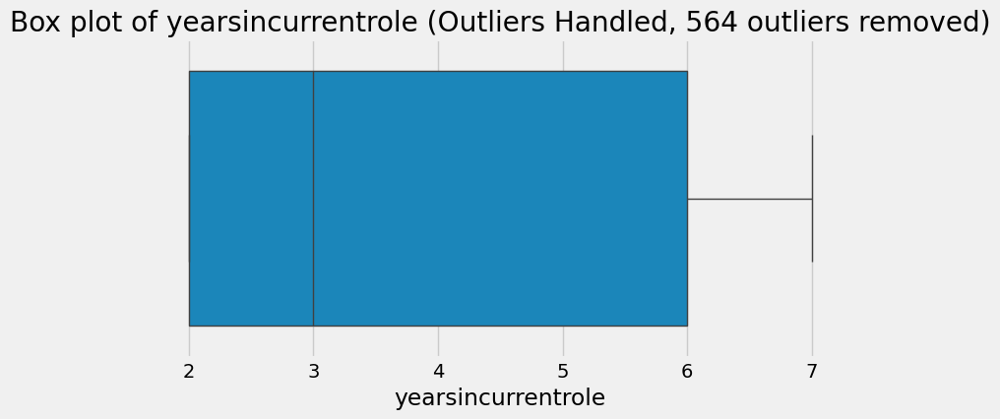

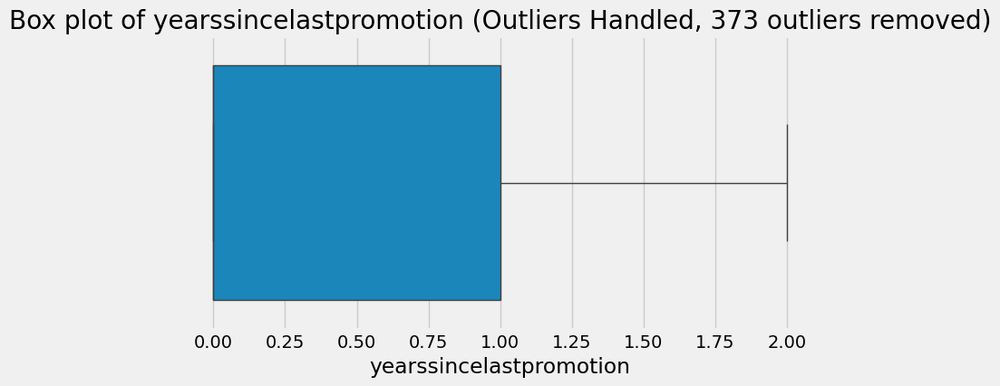

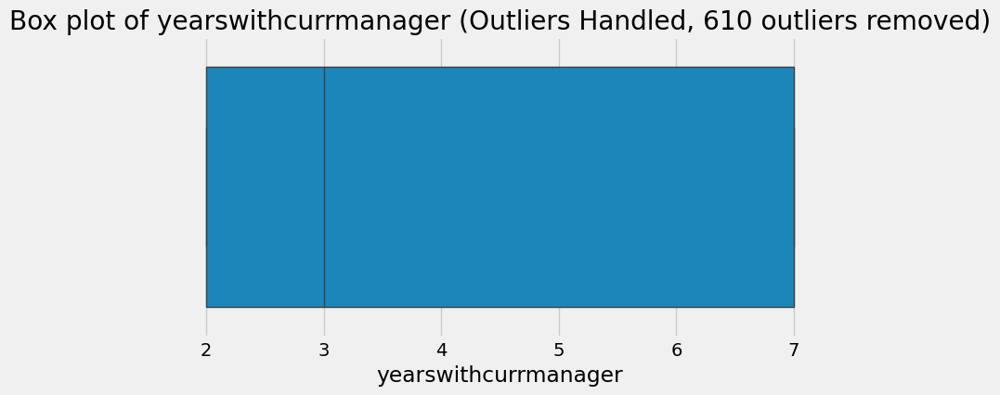

In [ ]:
# IQR METHOD

# Select numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Define a function to handle outliers
def handle_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_removed = data[(data >= lower_bound) & (data <= upper_bound)]
    outliers_count = len(data) - len(outliers_removed)
    return outliers_removed, outliers_count

# Handle outliers for each numerical column
for column in numerical_columns:
    outliers_removed, outliers_count = handle_outliers(df[column])
    df[column] = outliers_removed

    # Create box plot for the current numerical column
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[column])
    plt.title(f"Box plot of {column} (Outliers Handled, {outliers_count} outliers removed)")
    plt.show()

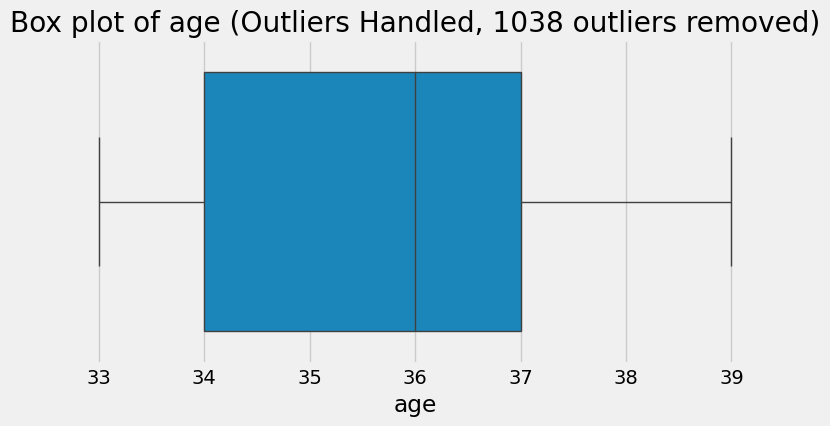

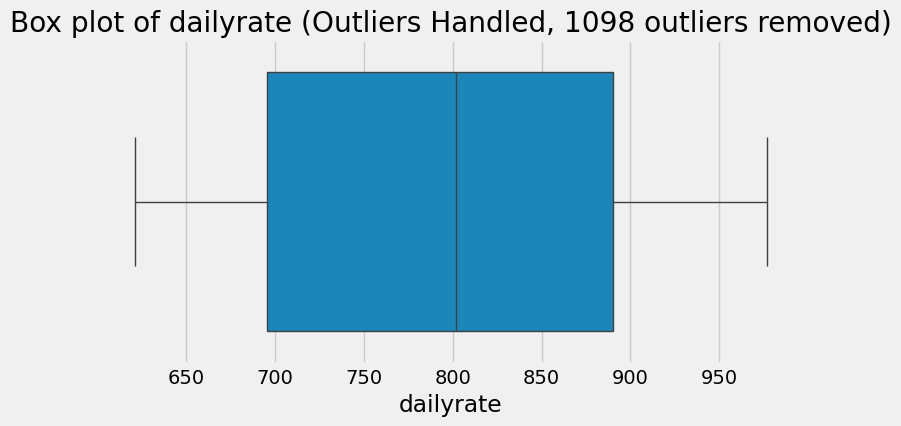

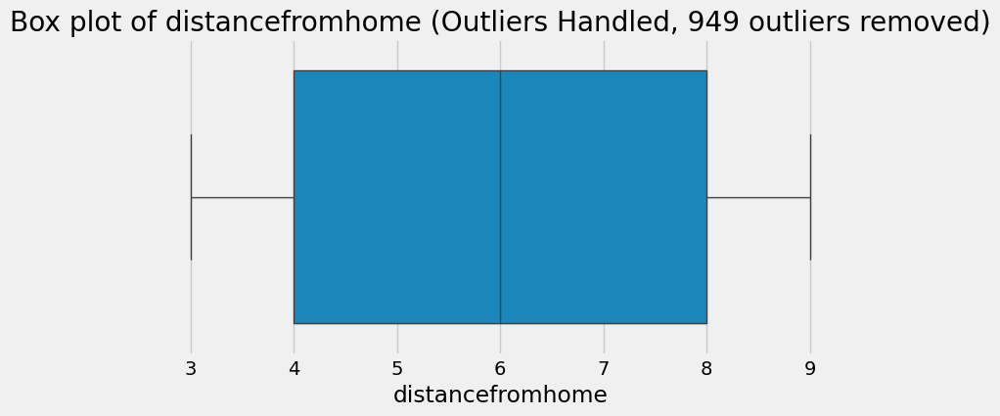

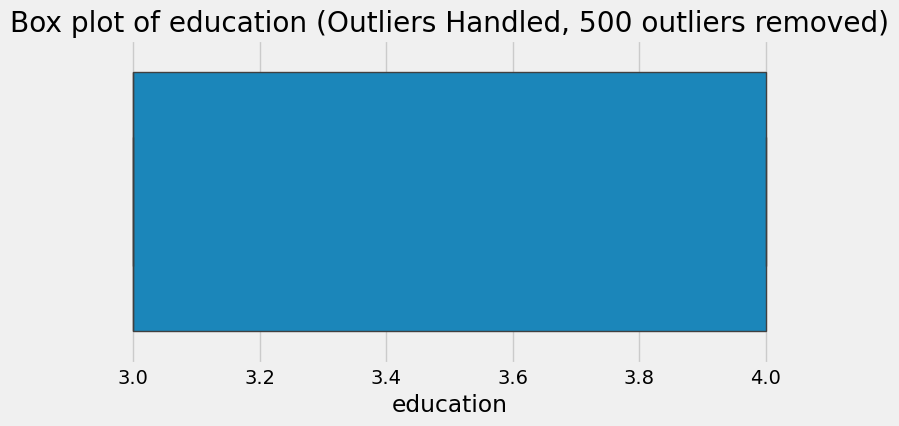

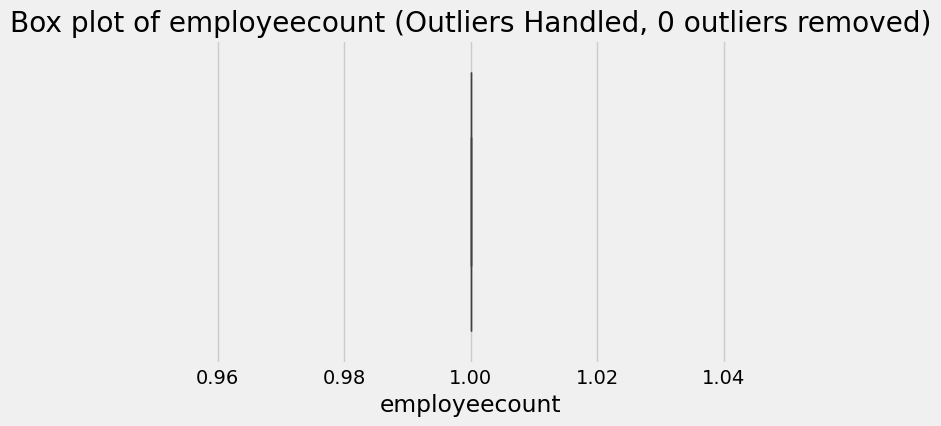

...

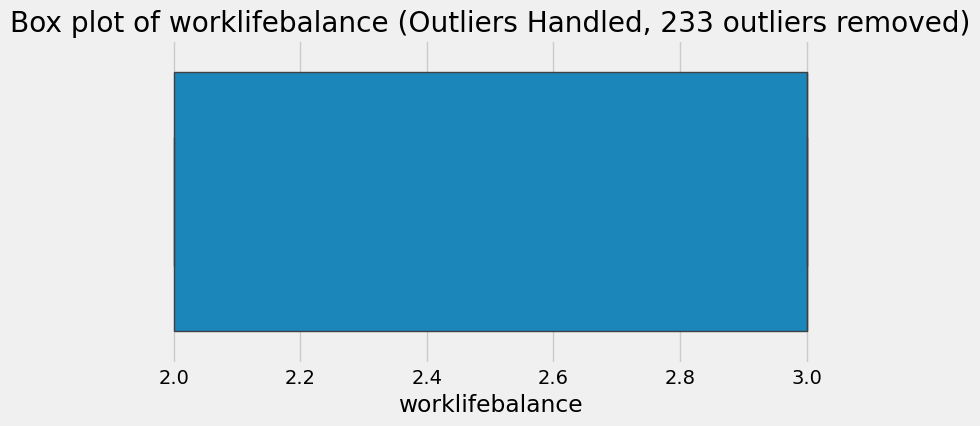

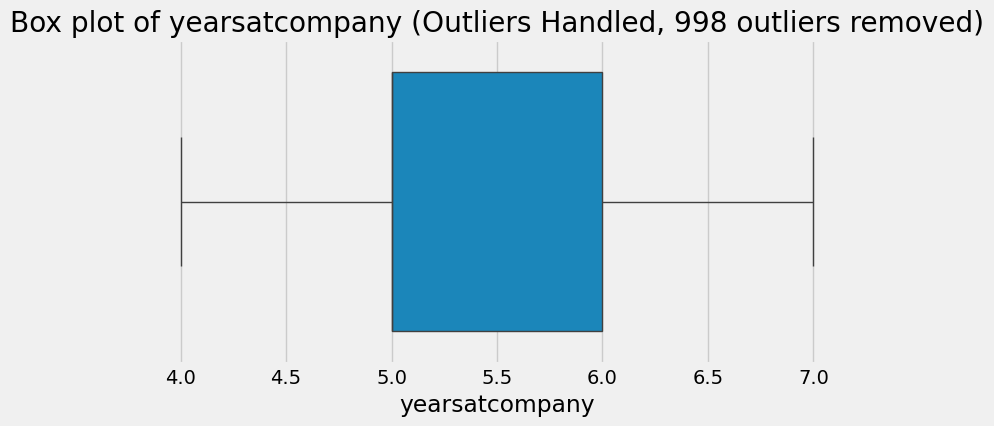

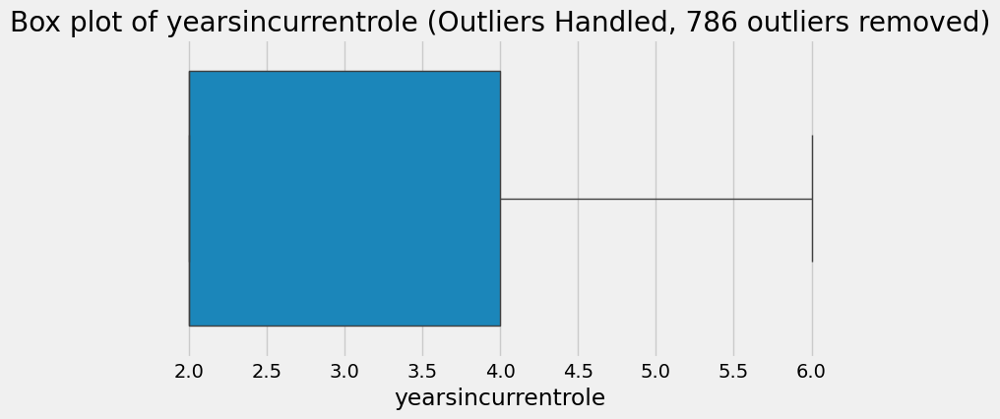

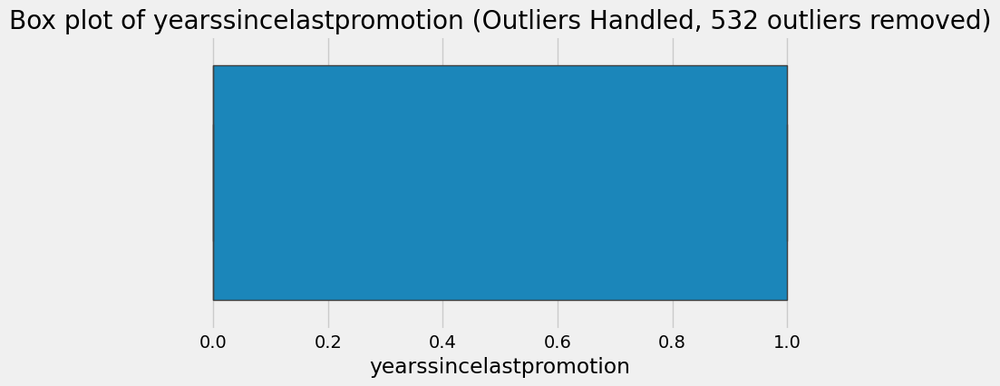

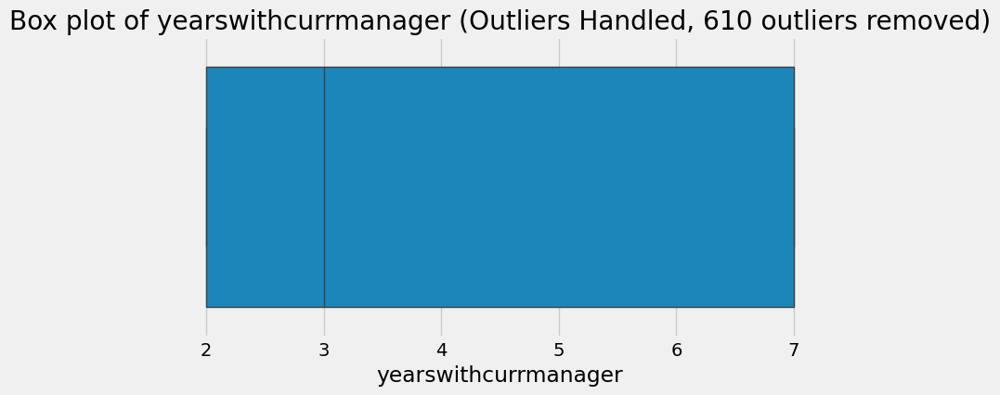

In [ ]:
# As per the asked question
# Select numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Define a function to handle outliers
def handle_outliers(data):
    lower_bound = data.quantile(0.25)
    upper_bound = data.quantile(0.75)
    outliers_removed = data[(data >= lower_bound) & (data <= upper_bound)]
    outliers_count = len(data) - len(outliers_removed)
    return outliers_removed, outliers_count

# Handle outliers for each numerical column
for column in numerical_columns:
    outliers_removed, outliers_count = handle_outliers(df[column])
    df[column] = outliers_removed

    # Create box plot for the current numerical column
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[column])
    plt.title(f"Box plot of {column} (Outliers Handled, {outliers_count} outliers removed)")
    plt.show()


 ### Target label imbalance

**Exercise 5: Check if there is an imbalance in target label [0.5 Mark]**

**Hint:** Use value_counts()

In [ ]:

# Count the occurrences of each class in the target label
attrition_counts = df['attrition'].value_counts()

# Print the counts of each class in the target label
print("Counts of each class in the target label:")
print(attrition_counts)


Counts of each class in the target label:
attrition
No     1233
Yes     237
Name: count, dtype: int64


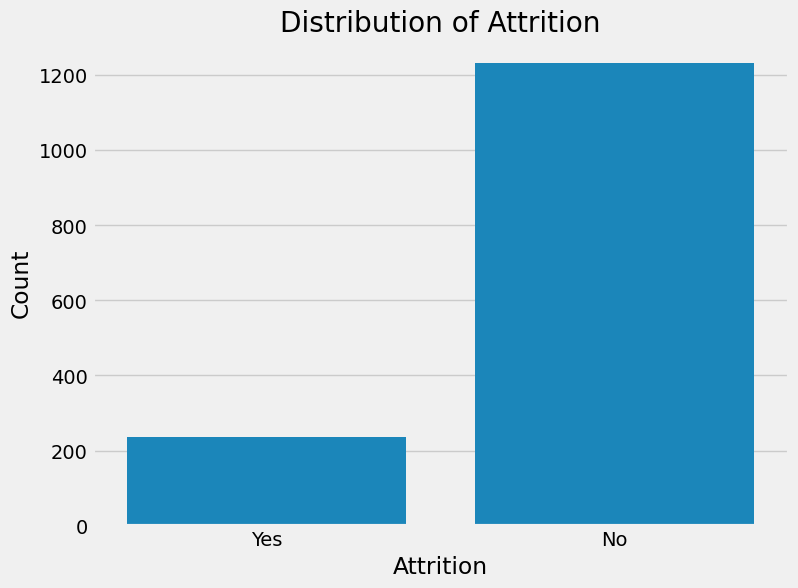

In [ ]:
# Plot barplot to visualize balance/imbalance
plt.figure(figsize=(8, 6))
sns.countplot(x='attrition', data=df)
plt.title("Distribution of Attrition")
plt.xlabel("Attrition")
plt.ylabel("Count")
plt.show()

If there is any imbalance in the dataset then a few techniques can be utilised (optional):
1. SMOTE
2. Cross Validation
3. Regularizing the model's parameters

LEVERAGING SMOTE (OPTIONAL)

SMOTE (Synthetic Minority Over-sampling Technique): SMOTE is a technique used to balance class distribution by creating synthetic samples from the minority class. It generates synthetic examples by selecting two or more similar instances (nearest neighbors) and interpolating between them.

In [ ]:
pip install imbalanced-learn

In [ ]:
import pandas as pd
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

df = pd.read_csv('/content/wa_fn_usec_hr_employee_attrition_tsv.csv')
# Separate features and target variable
X = df.drop(columns=['attrition'])  # Features
y = df['attrition']  # Target variable

# Identify categorical features
categorical_features = X.select_dtypes(include=['object']).columns

# Impute missing values (NaNs)
numeric_transformer = SimpleImputer(strategy='mean')
categorical_transformer = SimpleImputer(strategy='most_frequent')

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, X.select_dtypes(include=['int64', 'float64']).columns),
        ('cat', categorical_transformer, categorical_features)
    ]
)

X_imputed = preprocessor.fit_transform(X)

# One-hot encode categorical features
onehot_encoder = OneHotEncoder()
X_encoded = onehot_encoder.fit_transform(X_imputed)

# Apply SMOTE
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X_encoded, y)

# Check the class distribution after applying SMOTE
print("Class distribution after applying SMOTE:")
print(pd.Series(y_resampled).value_counts())

Class distribution after applying SMOTE:
attrition
Yes    1233
No     1233
Name: count, dtype: int64


###Plot pairplot

**Exercise 6: Visualize the relationships between the predictor variables and the target variable using a pairplot [0.5 Mark]**

**Hint:** Use sns.pairplot

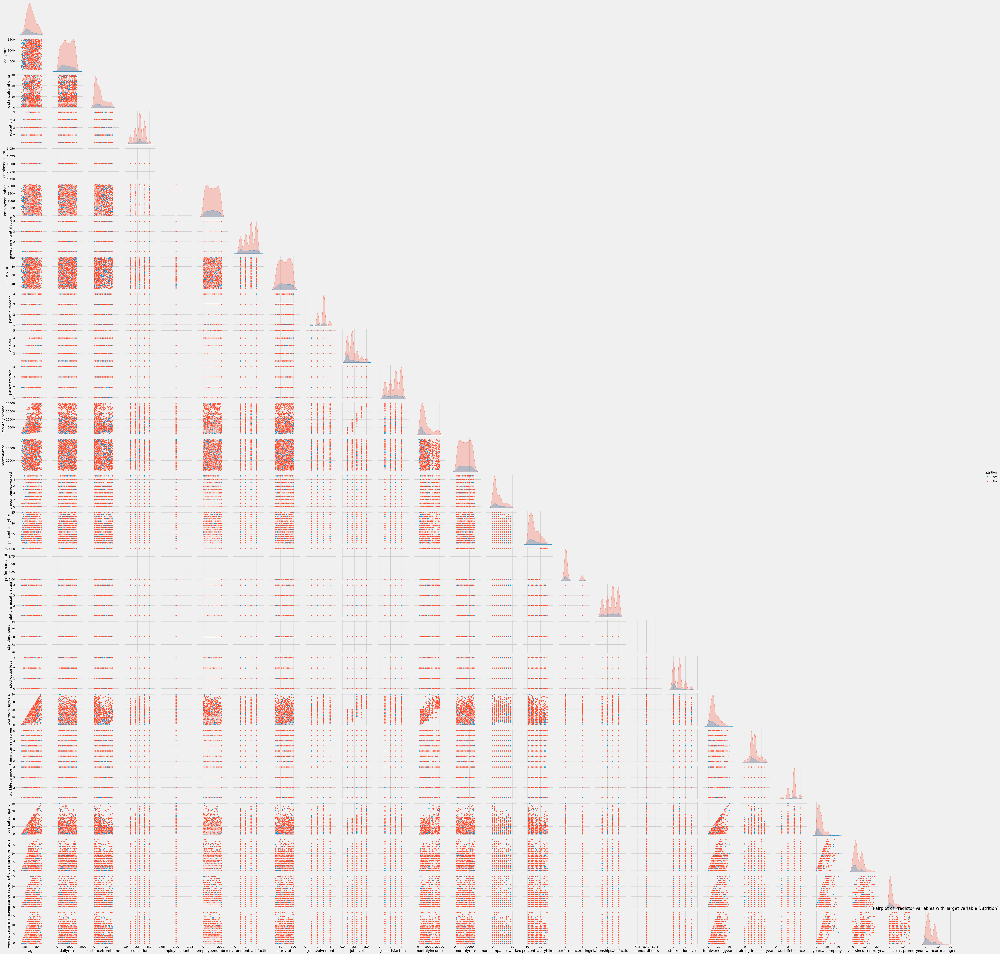

In [ ]:

# Visualize the relationships between the predictor variables and the target variable using a pairplot
sns.pairplot(df, hue="attrition", corner=True)
plt.title('Pairplot of Predictor Variables with Target Variable (Attrition)')
plt.show()

### Explore Correlation

- Plotting the Heatmap

**Exercise 7: Visualize the correlation among IBM employee attrition numerical features using a heatmap [0.5 Mark]**

Strongly Positive Correlated Features:
[('monthlyincome', 'joblevel'), ('performancerating', 'percentsalaryhike'), ('totalworkingyears', 'joblevel'), ('totalworkingyears', 'monthlyincome'), ('yearsincurrentrole', 'yearsatcompany'), ('yearswithcurrmanager', 'yearsatcompany'), ('yearswithcurrmanager', 'yearsincurrentrole')]

Strongly Negative Correlated Features:
[]

Moderately Positive Correlated Features:
[('joblevel', 'age'), ('monthlyincome', 'age'), ('totalworkingyears', 'age'), ('yearsatcompany', 'age'), ('yearsatcompany', 'joblevel'), ('yearsatcompany', 'monthlyincome'), ('yearsatcompany', 'totalworkingyears'), ('yearsincurrentrole', 'joblevel'), ('yearsincurrentrole', 'monthlyincome'), ('yearsincurrentrole', 'totalworkingyears'), ('yearssincelastpromotion', 'joblevel'), ('yearssincelastpromotion', 'monthlyincome'), ('yearssincelastpromotion', 'totalworkingyears'), ('yearssincelastpromotion', 'yearsatcompany'), ('yearssincelastpromotion', 'yearsincurrentrole'), ('yearswithcurrmana

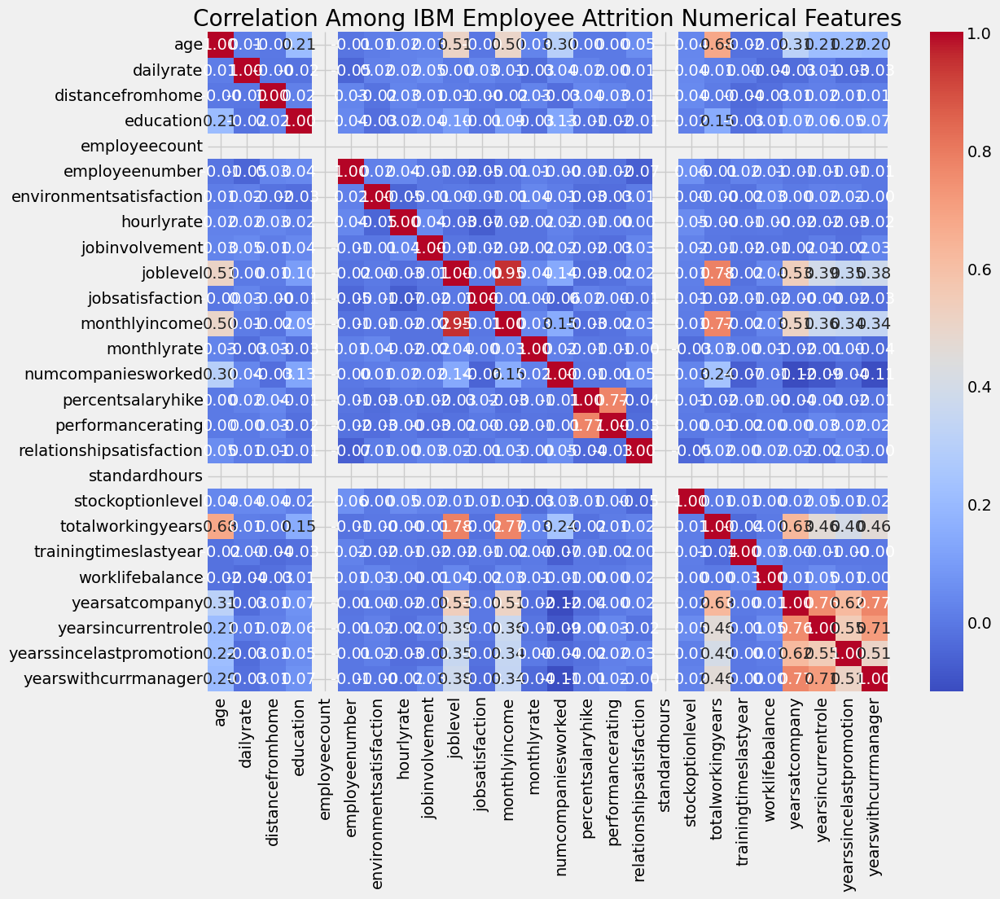

In [ ]:
# Visualize heatmap


# Select numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Calculate the correlation matrix
correlation_matrix = df[numerical_columns].corr()

# Set thresholds for correlation strength
strong_threshold = 0.7
moderate_threshold = 0.3
weak_threshold = 0.1

# Initialize lists to store correlated features
strong_positive_features = []
strong_negative_features = []
moderate_positive_features = []
moderate_negative_features = []
weak_positive_features = []
weak_negative_features = []

# Iterate over each pair of features in the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        # Check the strength of correlation
        correlation_strength = correlation_matrix.iloc[i, j]

        # Check the direction of correlation
        if correlation_strength >= strong_threshold:
            if correlation_matrix.iloc[i, j] > 0:
                strong_positive_features.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))
            else:
                strong_negative_features.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))
        elif correlation_strength >= moderate_threshold:
            if correlation_matrix.iloc[i, j] > 0:
                moderate_positive_features.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))
            else:
                moderate_negative_features.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))
        elif correlation_strength >= weak_threshold:
            if correlation_matrix.iloc[i, j] > 0:
                weak_positive_features.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))
            else:
                weak_negative_features.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))

# Print the lists of correlated features
print("Strongly Positive Correlated Features:")
print(strong_positive_features)
print("\nStrongly Negative Correlated Features:")
print(strong_negative_features)
print("\nModerately Positive Correlated Features:")
print(moderate_positive_features)
print("\nModerately Negative Correlated Features:")
print(moderate_negative_features)
print("\nWeak Positive Correlated Features:")
print(weak_positive_features)
print("\nWeak Negative Correlated Features:")
print(weak_negative_features)

# Plot the heatmap with a larger size
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Among IBM Employee Attrition Numerical Features")
plt.show()

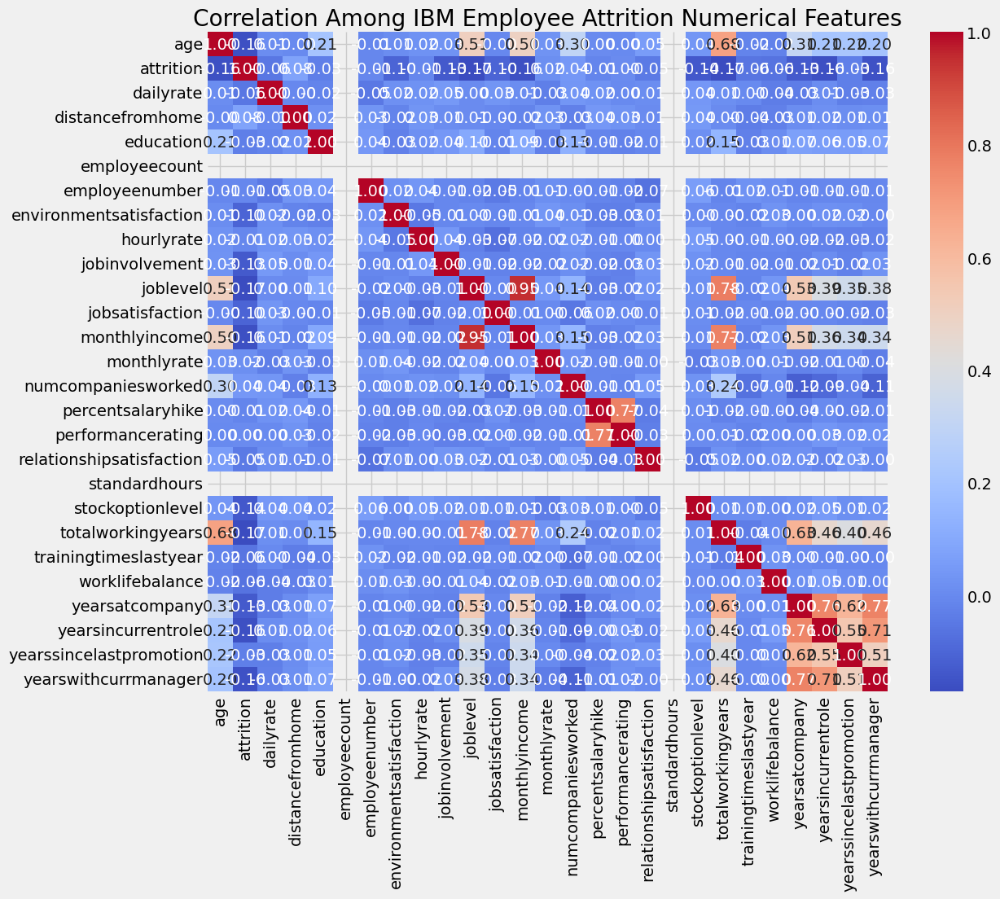

Correlation of Numerical Features with Target Variable ('attrition'):
age                        -0.159205
attrition                   1.000000
dailyrate                  -0.056652
distancefromhome            0.077924
education                  -0.031373
employeenumber             -0.010577
environmentsatisfaction    -0.103369
hourlyrate                 -0.006846
jobinvolvement             -0.130016
joblevel                   -0.169105
jobsatisfaction            -0.103481
monthlyincome              -0.159840
monthlyrate                 0.015170
numcompaniesworked          0.043494
percentsalaryhike          -0.013478
performancerating           0.002889
relationshipsatisfaction   -0.045872
stockoptionlevel           -0.137145
totalworkingyears          -0.171063
trainingtimeslastyear      -0.059478
worklifebalance            -0.063939
yearsatcompany             -0.134392
yearsincurrentrole         -0.160545
yearssincelastpromotion    -0.033019
yearswithcurrmanager       -0.156199
dtype

In [ ]:

# Convert 'attrition' column to numerical values
label_encoder = LabelEncoder()
df['attrition'] = label_encoder.fit_transform(df['attrition'])

# Select numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Calculate the correlation matrix
correlation_matrix = df[numerical_columns].corr()

# Calculate the correlation of features with the target variable ('attrition')
target_correlation = df[numerical_columns].corrwith(df['attrition']).dropna()

# Plot the heatmap with a larger size
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Among IBM Employee Attrition Numerical Features")
plt.show()

# Display correlation of features with the target variable
print("Correlation of Numerical Features with Target Variable ('attrition'):")
print(target_correlation)

Comment on the observations made with the pairplot and heatmap

# Part-B

### Preparing the test feature space
* Remove outliers if any
* Handle the categorical feature if required
* Other processing steps can also be followed.

In [ ]:
# YOUR CODE HERE

Optional:
Use `Hyperopt`, a hyperparameter tuning technique to identify the best set of parameters.

In the notebook, data processing is done separately for different models.
Considering the fact that different models may require data in different format and in turn different processes may be followed to process the data.

If the processing steps followed for the models are same, data processing can also be done once.

## Apply CatBoost

Catboost was released in 2017 by Yandex, showing, by their benchmark to be faster in prediction, better in accuracy, and easier to use for categorical data across a series of GBDT tasks. Additional capabilities of catboost include plotting feature interactions and object (row) importance.

[Here](https://catboost.ai/en/docs/) is the official documentation of CatBoost

### Data Processing for CatBoost

**Exercise 8: Data processing for CatBoost [1 Mark]**
* **Copy the dataframe that was created after removing the outliers**
* **Handle the categorical features if required**
* **Create target column and feature space**

**Hint:** Column containing the information on attrition will be the target column.

In [ ]:
# Copy the data
# YOUR CODE HERE

In [ ]:
# Target Column
# YOUR CODE HERE

In [ ]:
# Feature Space
# YOUR CODE HERE

### Model Definition

**Exercise 9: Define, train the model and display the results [2 Mark]**

**Hint:**
* Use CatBoostClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model. Refer [here](https://catboost.ai/en/docs/concepts/speed-up-training) to see some ways to speedup CatBoost training.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [ ]:
# Create CatBoost model
# YOUR CODE HERE

In [ ]:
# Model training
# YOUR CODE HERE

### Model performance

In [ ]:
# Model performance on all sets
# YOUR CODE HERE

## Apply XGBoost

XGBoost is a workhorse gradient boosted decision tree algorithm. Its been around since 2014 and has come to dominate the Kaggle and data science community. XGB introduced gradient boosting where new models are fit to the residuals of prior models and then added together, using a gradient descent algorithm to minimize the loss.

Read [here](https://xgboost.readthedocs.io/en/stable/parameter.html) on XGBoost parameters.

Refer [here](https://xgboost.readthedocs.io/en/stable/python/python_api.html#xgboost.XGBClassifier) for the official documentation of XGBoost classifier.

### Data Processing for XGBoost


**Exercise 10: Data Processing for XGBoost [1 Mark]**
* **Copy the dataframe after the outliers were removed.**
* **Handle the categorical features if required**
* **Create target column and feature space**

In [ ]:
# Copy dataframe
# YOUR CODE HERE

**Hint:** Use pd.get_dummies

In [ ]:
# Handling categorical features
# YOUR CODE HERE

In [ ]:
# Concat the dummy variables to actual dataframe and remove initial categorical columns
# YOUR CODE HERE

When creating the dummy variables, the name of attrition column was changed, rename to 'attrition' again.

**Hint:** Use .rename

In [ ]:
# Rename target column
# YOUR CODE HERE

In [ ]:
# Feature Space
# YOUR CODE HERE

# Targer label
# YOUR CODE HERE

### Model Definition

**Exercise 11: Define, train the model and display the results [2 Mark]**

**Hint:**
* Use XGBClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [ ]:
# Create XGBoost classifier model
# YOUR CODE HERE

In [ ]:
# Model training
# YOUR CODE HERE

### Model Performance

In [ ]:
# Model performance on all sets
# YOUR CODE HERE

## Apply LightGBM (Optional)

LightGBM is an open-source GBDT framework created by Microsoft as a fast and scalable alternative to XGB and GBM. By default LightGBM will train a Gradient Boosted Decision Tree (GBDT), but it also supports random forests, Dropouts meet Multiple Additive Regression Trees (DART), and Gradient Based One-Side Sampling (Goss).

To know more about LightGBM parameters, refer [here](https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMClassifier.html#lightgbm.LGBMClassifier).

### Feature Engineering for LightGBM

In [ ]:
## Following the same procedure as followed in XGBoost

# Copy the dataframe
# YOUR CODE HERE

# Handling categorical features
# YOUR CODE HERE

# Concat the dummy variables to actual dataframe and remove initial categorical columns
# YOUR CODE HERE

# Rename target column
# YOUR CODE HERE

# Features Space
# YOUR CODE HERE

# Target Label
# YOUR CODE HERE

### Model Definition

**Hint:**
* Use LGBMClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [ ]:
# Create LightGBM classifier model
# YOUR CODE HERE

In [ ]:
# Model training
# YOUR CODE HERE

### Model performance

In [ ]:
# Model performance on all sets
# YOUR CODE HERE

## Results

**Exercise 12: Create a dataframe of XGBoost results and CatBoost results and display them [0.5 Mark]**

**Hint:** Use pd.DataFrame

In [ ]:
# Create a dataframe for computed metrics for different models
# YOUR CODE HERE

Reference reading:
1. https://machinelearningmastery.com/xgboost-for-imbalanced-classification/